## Imports
We have 3 important files for this purpose and each and every dependency, class, import, function, variable etc is being imported from these modules

1. `detection_helpers` which I made to wrap the original `YOLOv-7` code along with helper functions
2. `tracking_helpers` has modular code which is used to wrap the `DeepSORT` repo and workings
3. `bridge_wrapper` acts as a bridge to bind **ANY** detection model with `DeepSORT`

In [1]:
from detection_helpers import *
from tracking_helpers import *
from  bridge_wrapper import *
from PIL import Image

c:\Users\smilepcc\anaconda3\envs\yolov7\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Detection
Detect objects using `Yolov-7`

Fusing layers... 
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block
RepConv.fuse_repvgg_block


c:\Users\smilepcc\anaconda3\envs\yolov7\lib\site-packages\torch\nn\functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  ..\c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)
c:\Users\smilepcc\anaconda3\envs\yolov7\lib\site-packages\torch\nn\modules\module.py:561: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the gradient for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more information.
  if param.grad is not None:


 Convert model to Traced-model... 
 traced_script_module saved! 
 model is traced! 



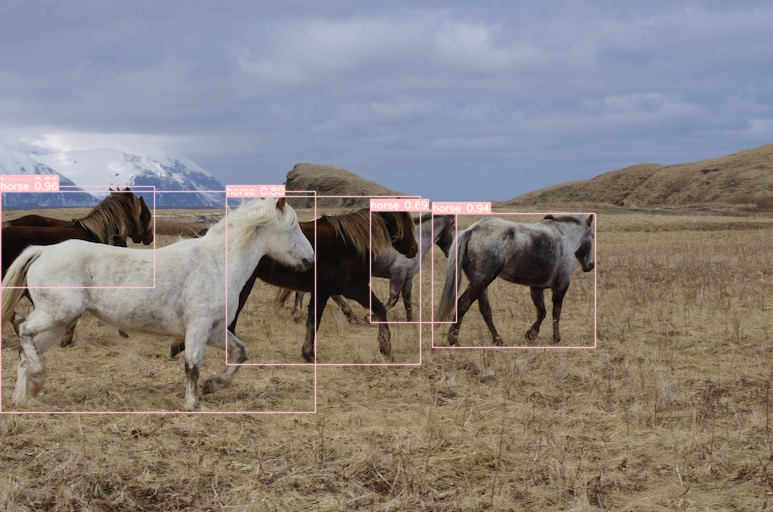

In [2]:
detector = Detector(classes = [0,17,32]) # it'll detect ONLY [person,horses,sports ball]. class = None means detect all classes. List info at: "data/coco.yaml"
detector.load_model('./weights/yolov7.pt',) # pass the path to the trained weight file


# Pass in any image path or Numpy Image using 'BGR' format
result = detector.detect('./IO_data/input/images/horses.jpg', plot_bb = True) # plot_bb = False output the predictions as [x,y,w,h, confidence, class]


if len(result.shape) == 3:# If it is image, convert it to proper image. detector will give "BGR" image
    result = Image.fromarray(cv2.cvtColor(result,cv2.COLOR_BGR2RGB)) 
    
result

# Tracking

Works as follows:
1. Read each frame of video using `OpenCV`
2. Get Bounding Box or Detections from the model per frame
3. Crop those patches and pass on to `reID` model for re identification which is a part of `DeepSORT` method
4. Get the above embeddings and then use `Kalman Filtering` and `Hungerian assignment` to assign the correct BB to the respective object
5. Show, Save the frames

In [3]:
# Initialise  class that binds detector and tracker in one class
tracker = YOLOv7_DeepSORT(reID_model_path="./deep_sort/model_weights/mars-small128.pb", detector=detector)

# output = None will not save the output video
# tracker.track_video("./IO_data/input/video/street.mp4", output="./IO_data/output/street.avi", show_live = True, skip_frames = 0, count_objects = True, verbose=1)

## Scripts for handling Videos on `Colab / Jupyter Notebook`

### Download a video from Youtube

In [9]:
! pip install pytube
from pytube import YouTube 

link = "https://youtu.be/22qjrlv7myM"
yt = YouTube(link)  

try:
    yt.streams.filter(progressive = True, file_extension = "mp4", resolution = "720p").first().download(output_path = "./", filename = "test.mp4",)
except Exception as e: print(e)

### Trim an existing video

In [10]:
! pip install moviepy
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip

ffmpeg_extract_subclip("test.mp4", 10, 100, targetname="trim.mp4") # trim from 10th second to 100th second

Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


### Show an MP4 video Notebook

In [11]:
from base64 import b64encode
from IPython.display import HTML

mp4 = open('trim.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""<video width=400 controls><source src="%s" type="video/mp4"></video>""" % data_url)